In [1]:
import scanpy as sc
import numpy as np
import anndata as ad

import random
import torch
import sklearn
import os
import pandas as pd

In [2]:
def plot_ndreamer(dataset_name, cell_type_key, batch_key, condition_key):
    print("adata preprocessing...")

    import warnings
    warnings.filterwarnings("ignore")
    warnings.filterwarnings("ignore", category=FutureWarning)

    adata = sc.read_h5ad("./" + dataset_name + "/adata.h5ad")
    adata.raw = None

    if batch_key is None:
        batch_key=condition_key
    if isinstance(batch_key, str):
        batch_key = [batch_key]

    batch_all = []
    for i in range(adata.shape[0]):
        tmp = "__".join([adata.obs[batch_keyj][i] for batch_keyj in batch_key])
        batch_all.append(tmp)
    batch_all = np.array(batch_all)
    adata.obs["batch_all"] = batch_all
    adata.obs["batch_all"] = adata.obs["batch_all"].astype("category")
    print("batch_all", np.unique(batch_all))

    batch_all_with_condition = []
    for i in range(adata.shape[0]):
        tmp = "__".join([adata.obs[batch_keyj][i] for batch_keyj in batch_key])
        tmp = tmp + "__" + adata.obs[condition_key][i]
        batch_all_with_condition.append(tmp)
    batch_all_with_condition = np.array(batch_all_with_condition)
    adata.obs["batch_all_with_condition"] = batch_all_with_condition
    adata.obs["batch_all_with_condition"] = adata.obs["batch_all_with_condition"].astype("category")
    print("batch_all_with_condition", np.unique(batch_all_with_condition))

    main_effect_adata = ad.AnnData(adata.obsm['X_effect_modifier_space_PCA'], dtype=np.float32)
    main_effect_adata.obs = adata.obs.copy()

    integrated = []
    for filei in os.listdir("./" + dataset_name):
        if filei.find("expression.h5ad") > 0:
            integrated.append(sc.read_h5ad("./" + dataset_name + "/" + filei))
    integrated = ad.concat(integrated, merge="same", uns_merge="same")

    # Process `batch_all` for denoised data
    batch_all_denoise = []
    for i in range(integrated.shape[0]):
        tmp = "__".join([integrated.obs[batch_keyj][i] for batch_keyj in batch_key])
        batch_all_denoise.append(tmp)
    batch_all_denoise = np.array(batch_all_denoise)
    integrated.obs["batch_all"] = batch_all_denoise
    integrated.obs["batch_all"] = integrated.obs["batch_all"].astype("category")
    print("batch_all_denoise", np.unique(batch_all_denoise))

    # Process `batch_all_with_condition` for denoised data
    batch_all_with_condition_denoise = []
    for i in range(integrated.shape[0]):
        tmp = "__".join([integrated.obs[batch_keyj][i] for batch_keyj in batch_key])
        tmp = tmp + "__" + integrated.obs[condition_key][i]
        batch_all_with_condition_denoise.append(tmp)
    batch_all_with_condition_denoise = np.array(batch_all_with_condition_denoise)
    integrated.obs["batch_all_with_condition"] = batch_all_with_condition_denoise
    integrated.obs["batch_all_with_condition"] = integrated.obs["batch_all_with_condition"].astype("category")
    print("batch_all_with_condition_denoise", np.unique(batch_all_with_condition_denoise))

    # Handle `ITE` files
    ITE = []
    for filei in os.listdir("./" + dataset_name):
        if filei.find("ITE.h5ad") > 0:
            ITE.append(sc.read_h5ad("./" + dataset_name + "/" + filei))
    ITE = ad.concat(ITE, merge="same", uns_merge="same")

    # Process `batch_all` for ITE data
    batch_all_ite = []
    for i in range(ITE.shape[0]):
        tmp = "__".join([ITE.obs[batch_keyj][i] for batch_keyj in batch_key])
        batch_all_ite.append(tmp)
    batch_all_ite = np.array(batch_all_ite)
    ITE.obs["batch_all"] = batch_all_ite
    ITE.obs["batch_all"] = ITE.obs["batch_all"].astype("category")
    print("batch_all_ite", np.unique(batch_all_ite))

    # Process `batch_all_with_condition` for ITE data
    batch_all_with_condition_ite = []
    for i in range(ITE.shape[0]):
        tmp = "__".join([ITE.obs[batch_keyj][i] for batch_keyj in batch_key])
        tmp = tmp + "__" + ITE.obs[condition_key][i]
        batch_all_with_condition_ite.append(tmp)
    batch_all_with_condition_ite = np.array(batch_all_with_condition_ite)
    ITE.obs["batch_all_with_condition"] = batch_all_with_condition_ite
    ITE.obs["batch_all_with_condition"] = ITE.obs["batch_all_with_condition"].astype("category")
    print("batch_all_with_condition_ite", np.unique(batch_all_with_condition_ite))

    batch_key.append("batch_all")
    batch_key.append("batch_all_with_condition")
    print("Finish preprocess")

    print("Plot of main effect:")
    if main_effect_adata.shape[1] > 60:
        sc.pp.pca(main_effect_adata)
    else:
        main_effect_adata.obsm['X_pca'] = main_effect_adata.X.copy()
    sc.pp.neighbors(main_effect_adata, n_neighbors=15)
    sc.tl.umap(main_effect_adata)
    for colori in [cell_type_key, condition_key] + batch_key:
        sc.pl.umap(main_effect_adata, color=colori, ncols=1)

    print("Plot of denoised expression")
    sc.pp.pca(integrated)
    sc.pp.neighbors(integrated, n_neighbors=15)
    sc.tl.umap(integrated)
    for colori in [cell_type_key, condition_key] + batch_key:
        sc.pl.umap(integrated, color=colori, ncols=1)

    print("Plot of ITE")
    sc.pp.pca(ITE)
    sc.pp.neighbors(ITE, n_neighbors=15)
    sc.tl.umap(ITE)
    for colori in [cell_type_key, condition_key] + batch_key:
        sc.pl.umap(ITE, color=colori, ncols=1)

    print("Within each unique condition, plot main effect")
    unique_conditions = np.unique(np.array(integrated.obs[condition_key]))
    for conditioni in unique_conditions:
        print("Now evaluating", conditioni, "main effect")
        main_effect_adatai = main_effect_adata[main_effect_adata.obs[condition_key] == conditioni]
        for colori in [cell_type_key] + batch_key:
            sc.pl.umap(main_effect_adatai, color=colori, ncols=1)
        print("-"*20)

    print("Within each unique condition, plot denoised expression")
    unique_conditions = np.unique(np.array(integrated.obs[condition_key]))
    for conditioni in unique_conditions:
        print("Now evaluating", conditioni, "denoised expression")
        integratedi = integrated[integrated.obs[condition_key] == conditioni]
        for colori in [cell_type_key] + batch_key:
            sc.pl.umap(integratedi, color=colori, ncols=1)
        print("-" * 20)

    print("Within each unique condition, plot ITE")
    unique_conditions = np.unique(np.array(integrated.obs[condition_key]))
    for conditioni in unique_conditions:
        print("Now evaluating", conditioni, "ITE")
        if np.sum(ITE.obs[condition_key] == conditioni)==0:
            continue
        ITEi = ITE[ITE.obs[condition_key] == conditioni]
        for colori in [cell_type_key] + batch_key:
            sc.pl.umap(ITEi, color=colori, ncols=1)
        print("-" * 20)

adata preprocessing...
batch_all ['1' '10' '11' '12' '13' '14' '15' '16' '17' '18' '2' '3' '4' '5' '6' '7'
 '8' '9']
batch_all_with_condition ['10__mutated' '10__nan' '11__mutated' '11__nan' '12__mutated' '12__nan'
 '13__mutated' '13__nan' '14__mutated' '14__nan' '15__mutated' '15__nan'
 '16__mutated' '16__nan' '17__mutated' '18__mutated' '18__nan'
 '1__mutated' '1__nan' '2__mutated' '2__nan' '3__mutated' '3__nan'
 '4__mutated' '4__nan' '5__mutated' '5__nan' '6__mutated' '6__nan'
 '7__mutated' '7__nan' '8__mutated' '8__nan' '9__mutated' '9__nan']
batch_all_denoise ['1' '10' '11' '12' '13' '14' '15' '16' '17' '18' '2' '3' '4' '5' '6' '7'
 '8' '9']
batch_all_with_condition_denoise ['10__mutated' '10__nan' '11__mutated' '11__nan' '12__mutated' '12__nan'
 '13__mutated' '13__nan' '14__mutated' '14__nan' '15__mutated' '15__nan'
 '16__mutated' '16__nan' '17__mutated' '18__mutated' '18__nan'
 '1__mutated' '1__nan' '2__mutated' '2__nan' '3__mutated' '3__nan'
 '4__mutated' '4__nan' '5__mutated' 

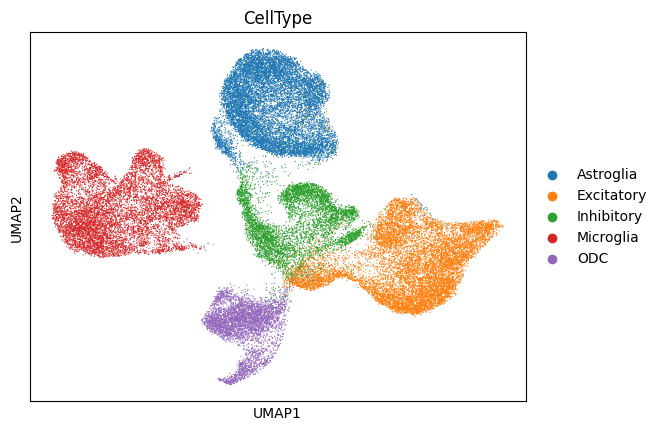

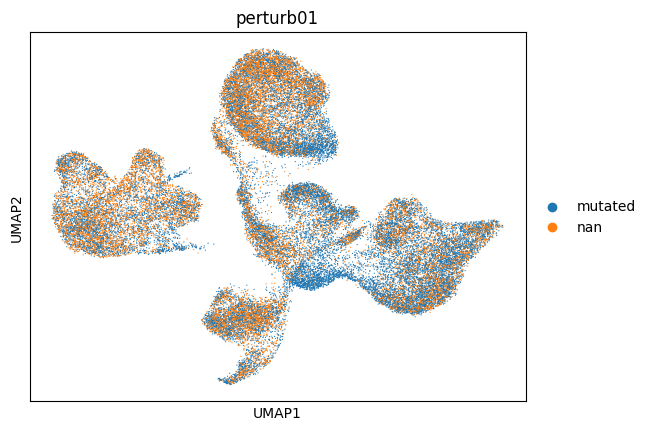

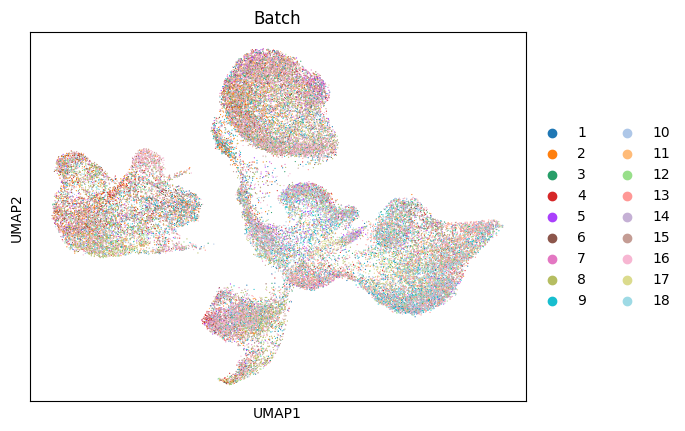

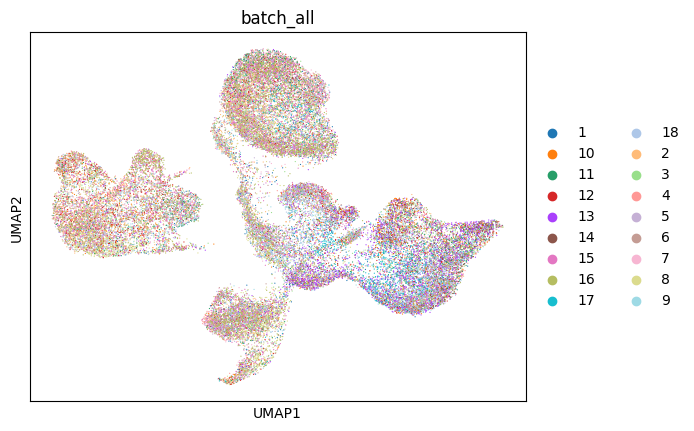

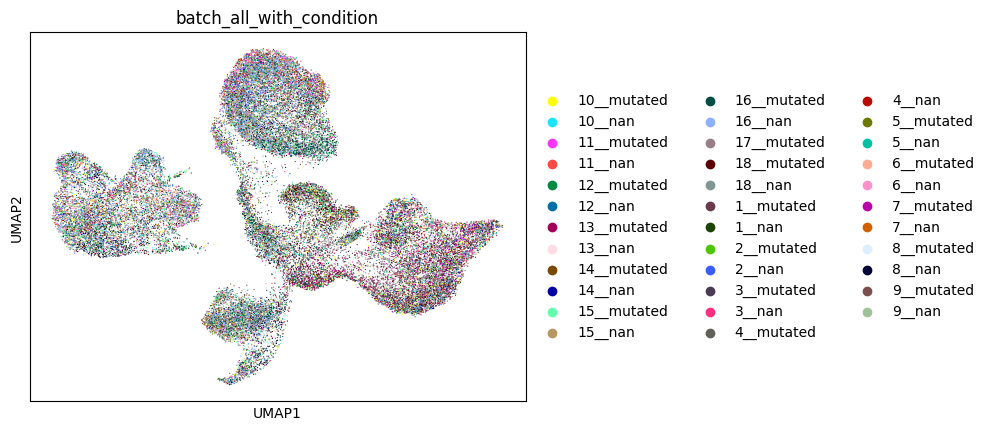

Plot of denoised expression


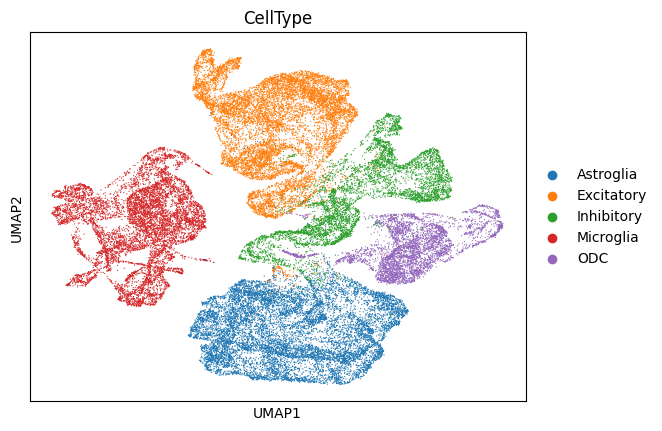

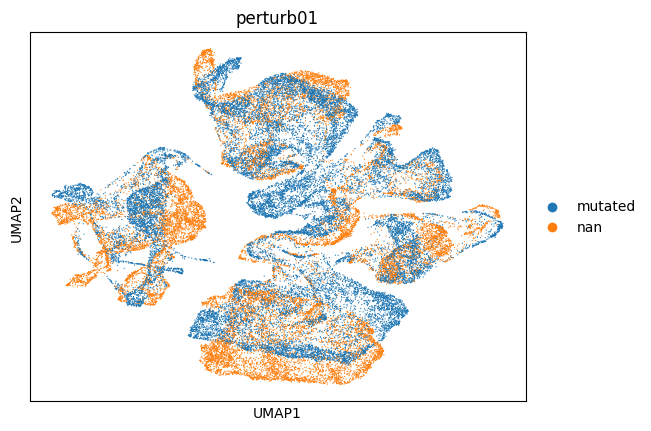

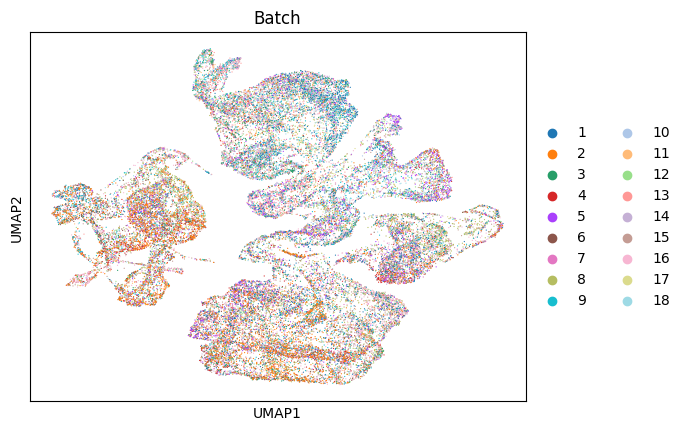

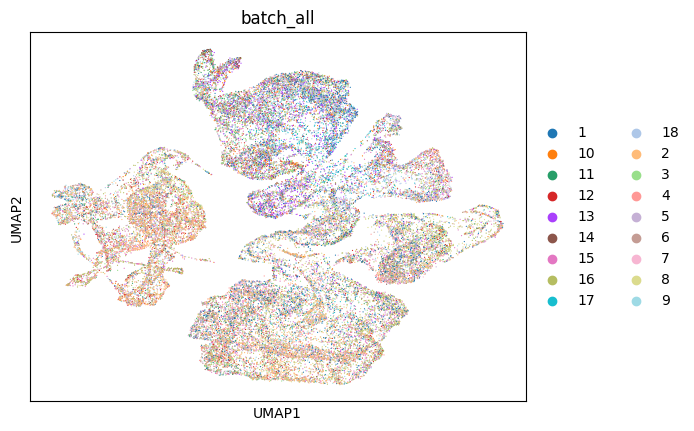

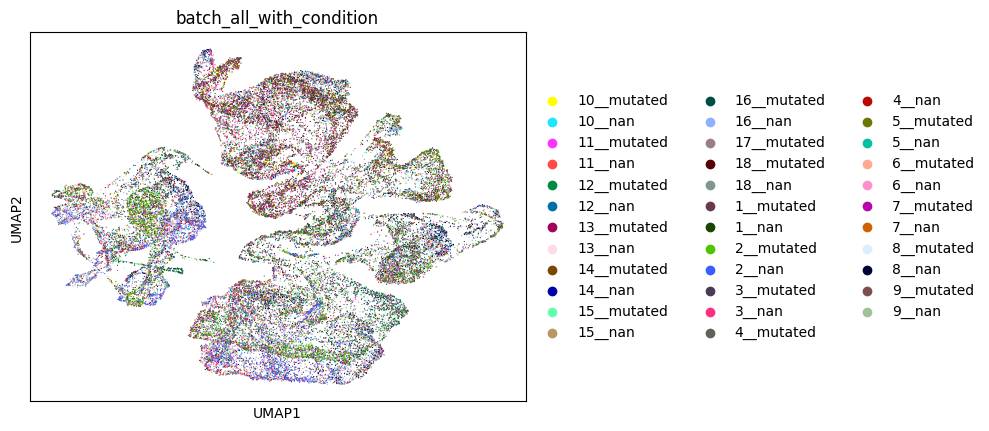

Plot of ITE


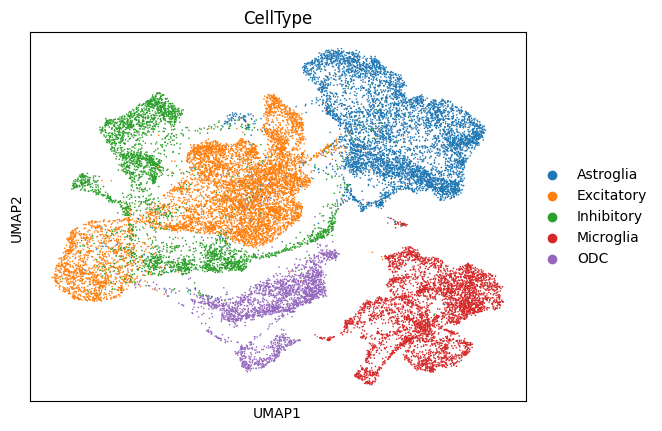

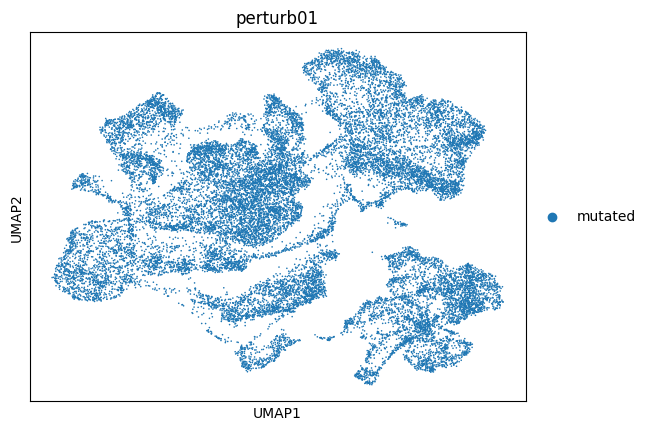

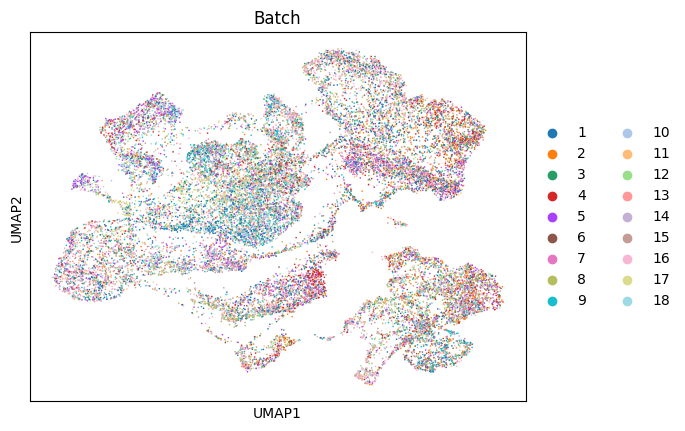

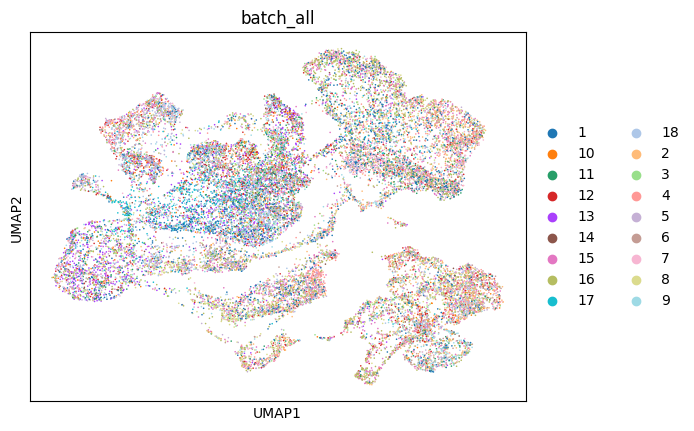

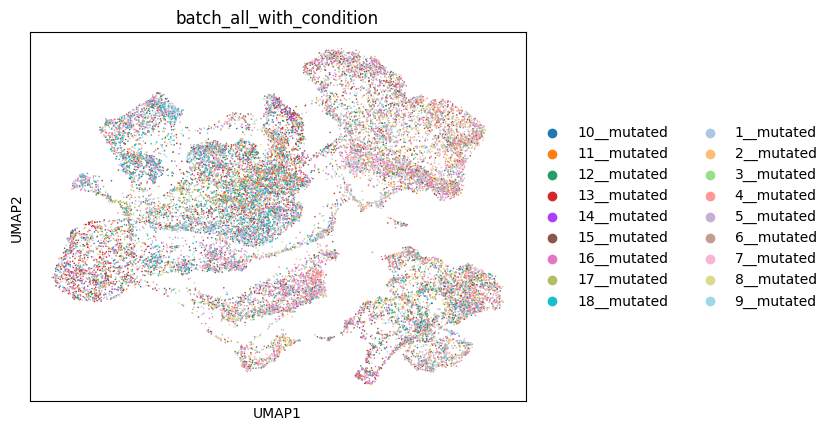

Within each unique condition, plot main effect
Now evaluating mutated main effect


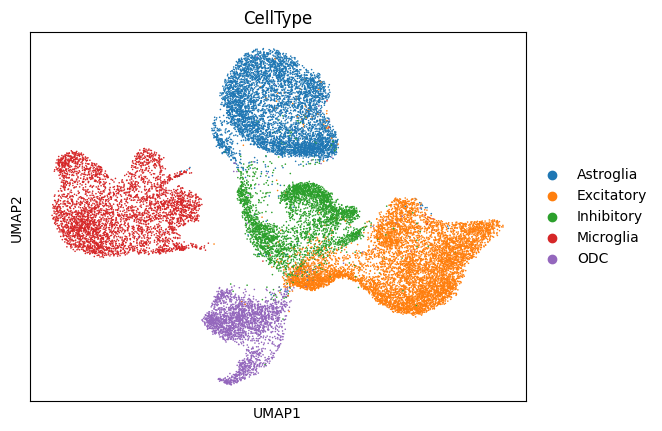

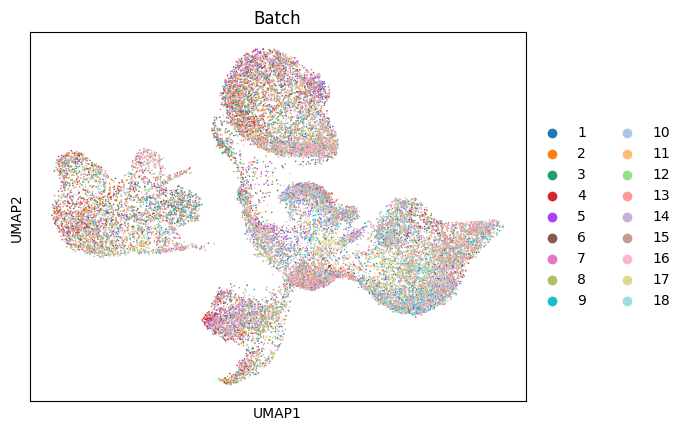

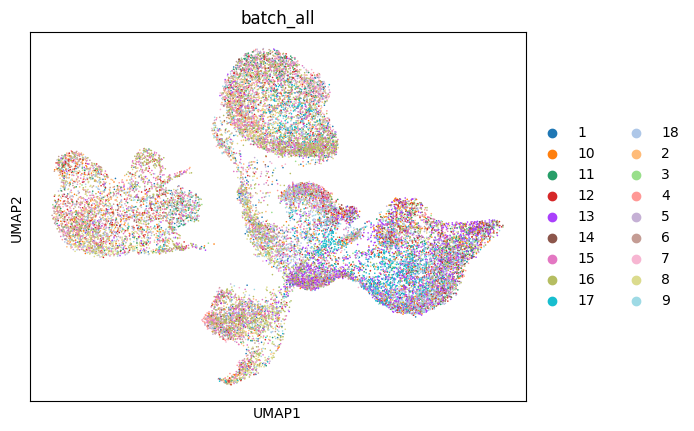

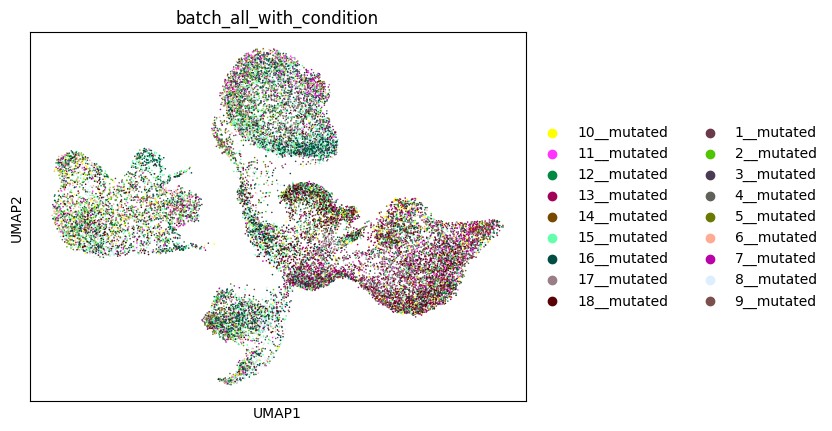

--------------------
Now evaluating nan main effect


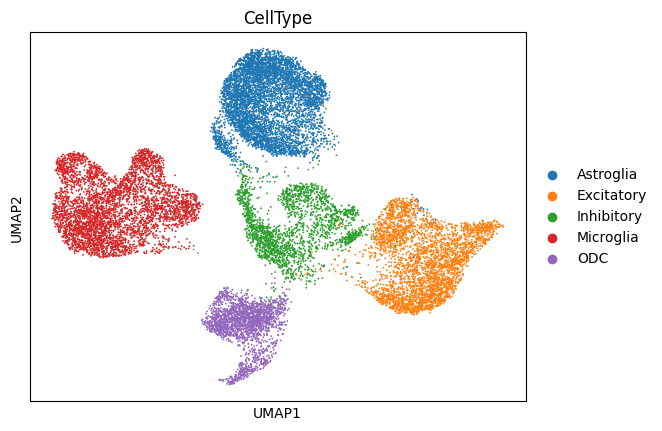

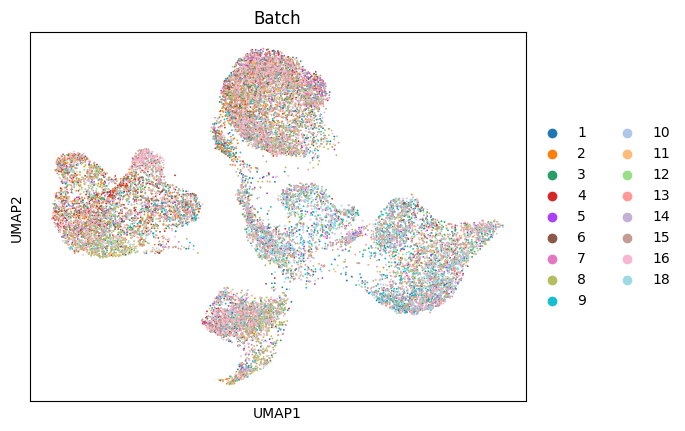

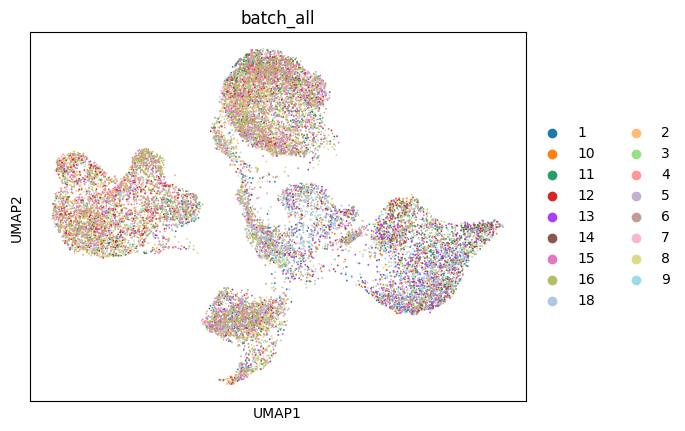

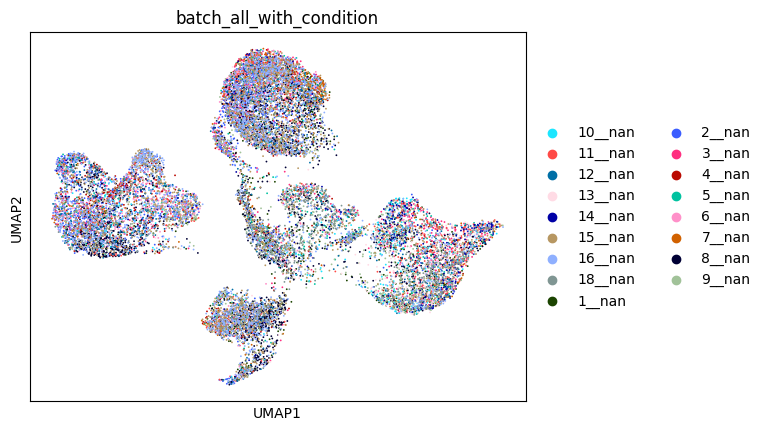

--------------------
Within each unique condition, plot denoised expression
Now evaluating mutated denoised expression


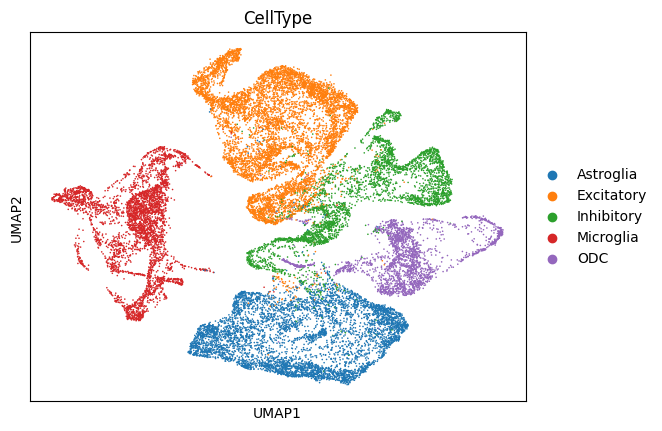

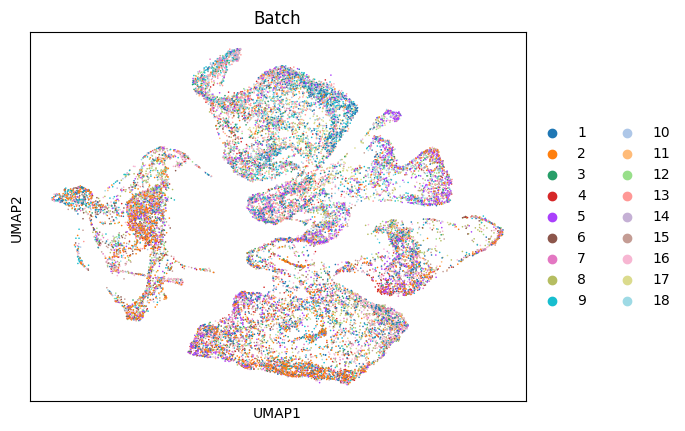

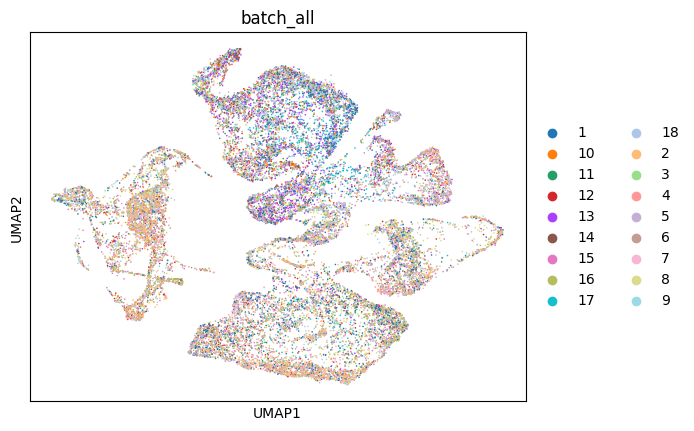

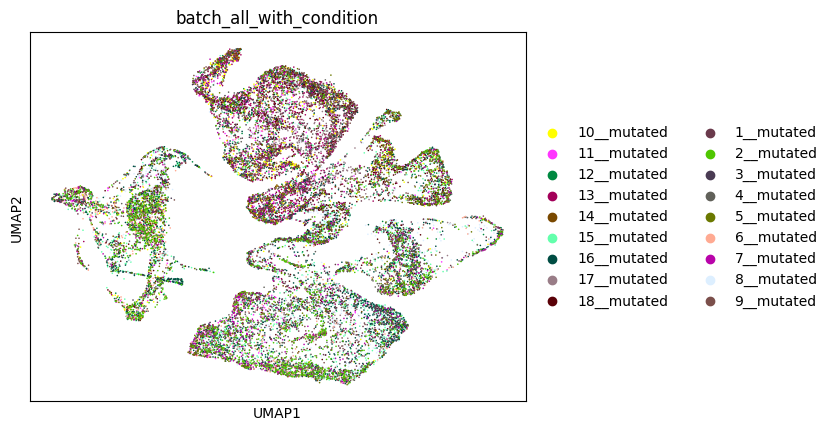

--------------------
Now evaluating nan denoised expression


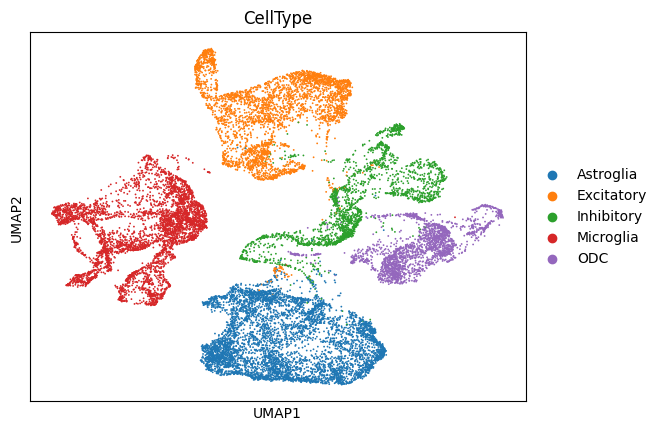

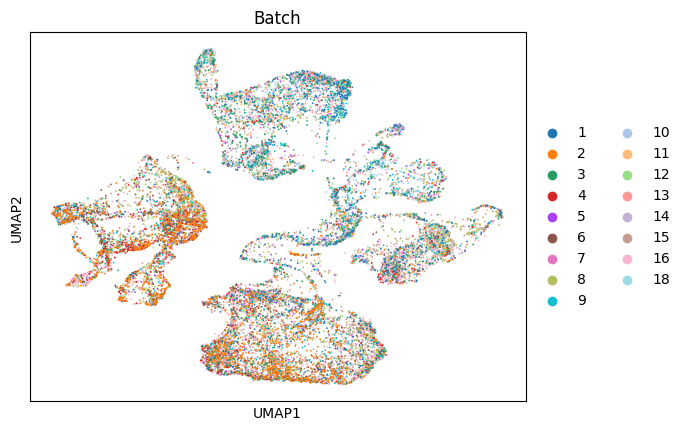

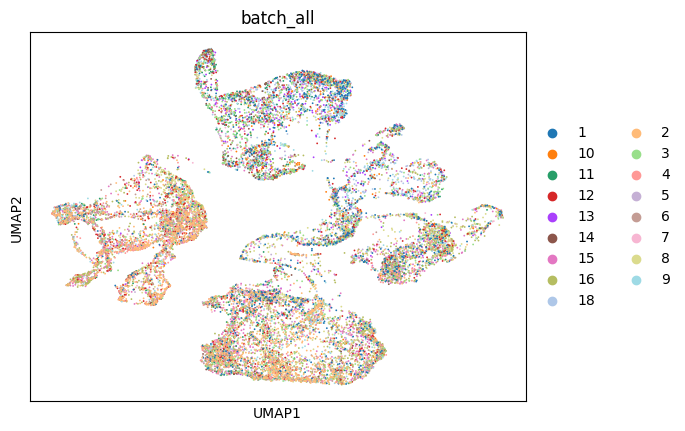

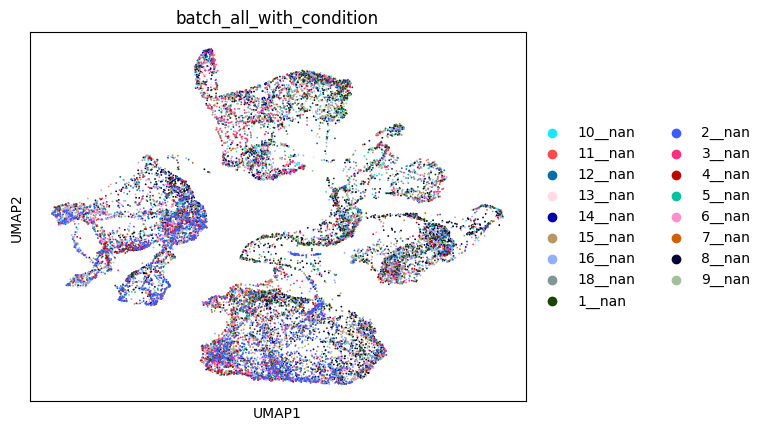

--------------------
Within each unique condition, plot ITE
Now evaluating mutated ITE


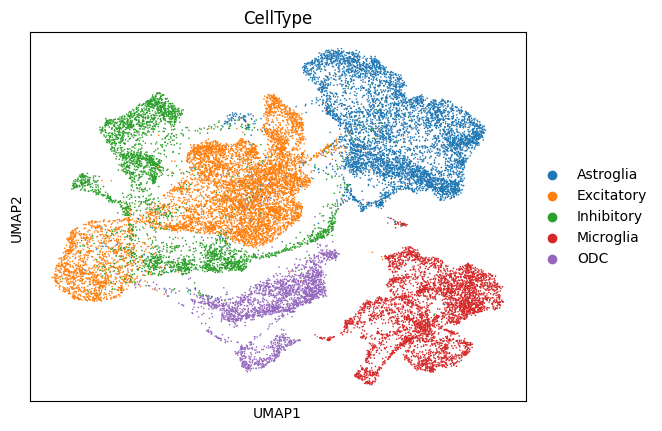

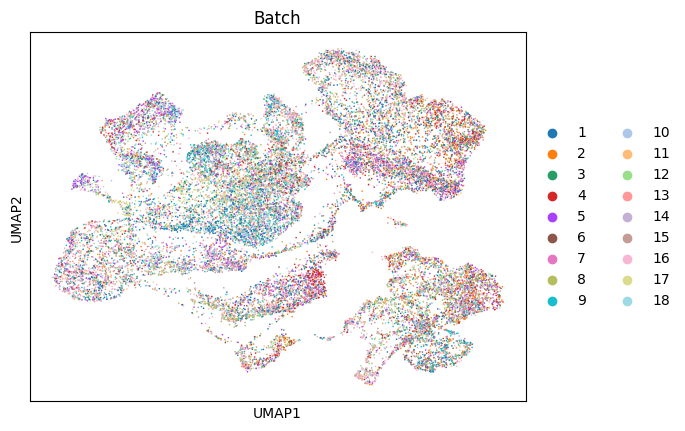

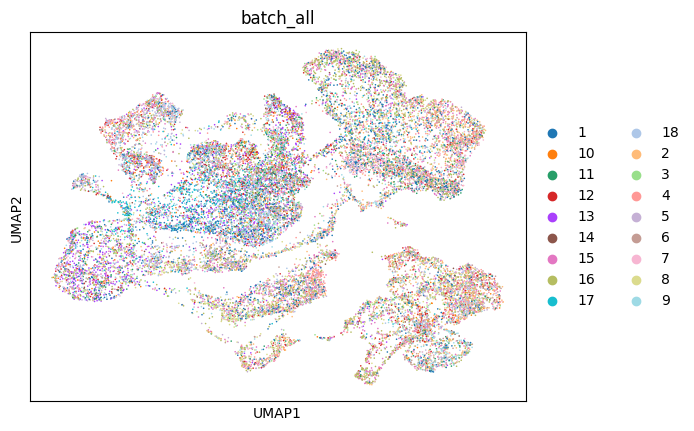

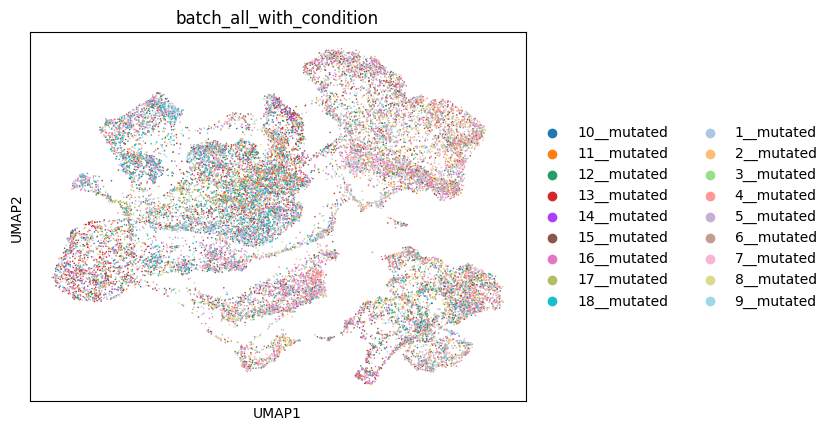

--------------------
Now evaluating nan ITE


In [4]:
plot_ndreamer(dataset_name="ASD101", cell_type_key="CellType", batch_key="Batch", condition_key="perturb01")

adata preprocessing...
batch_all ['rep1' 'rep2' 'rep3']
batch_all_with_condition ['rep1__NT' 'rep1__Perturbed' 'rep2__NT' 'rep2__Perturbed' 'rep3__NT'
 'rep3__Perturbed']
batch_all_denoise ['rep1' 'rep2' 'rep3']
batch_all_with_condition_denoise ['rep1__NT' 'rep1__Perturbed' 'rep2__NT' 'rep2__Perturbed' 'rep3__NT'
 'rep3__Perturbed']
batch_all_ite ['rep1' 'rep2' 'rep3']
batch_all_with_condition_ite ['rep1__Perturbed' 'rep2__Perturbed' 'rep3__Perturbed']
Finish preprocess
Plot of main effect:


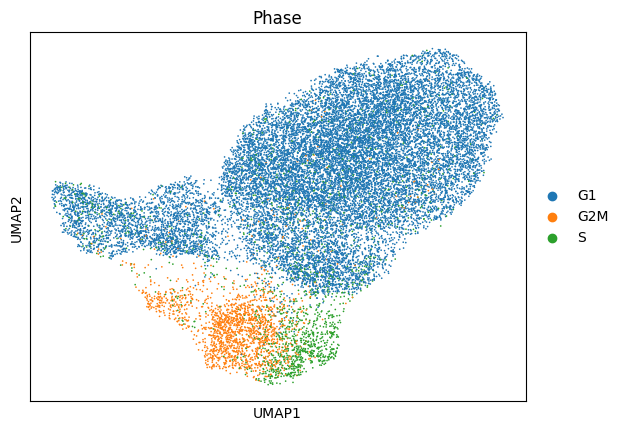

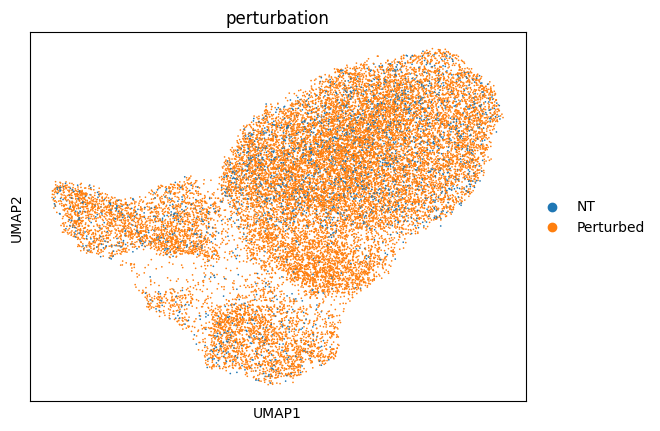

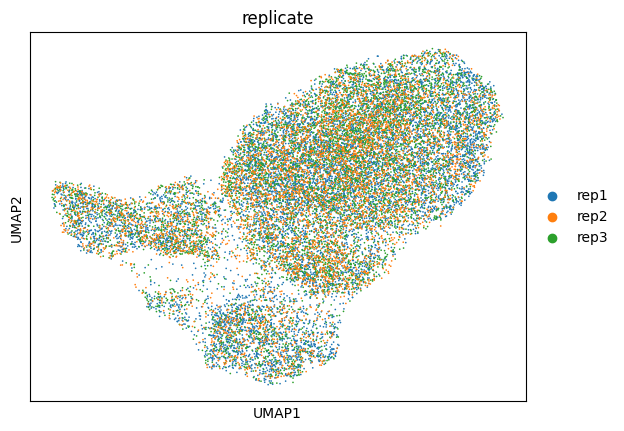

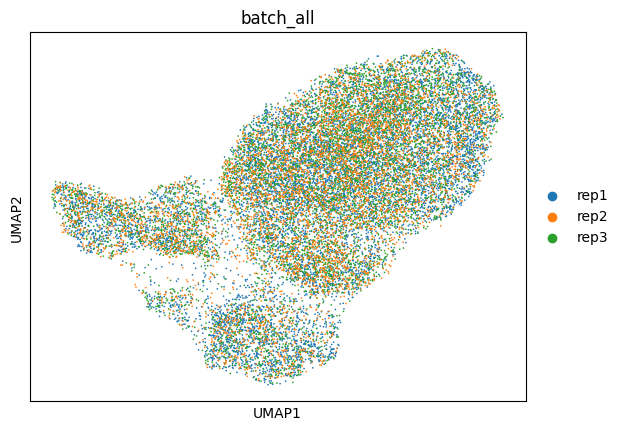

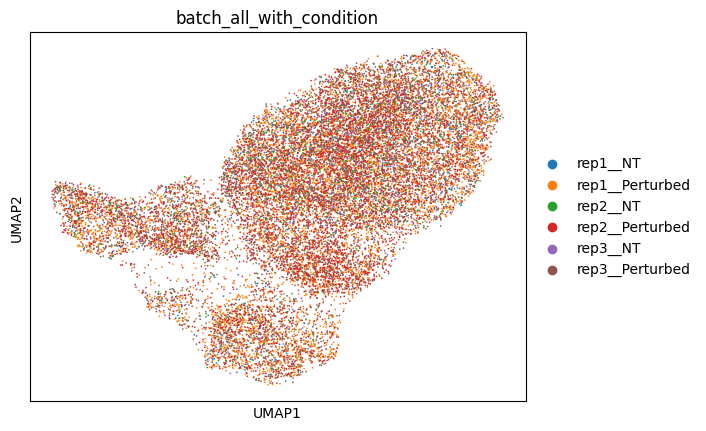

Plot of denoised expression


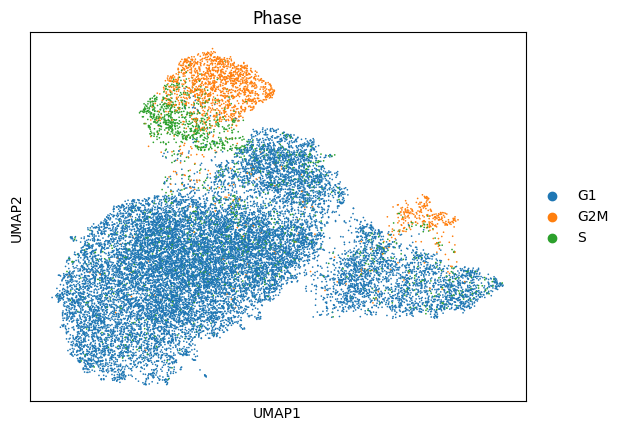

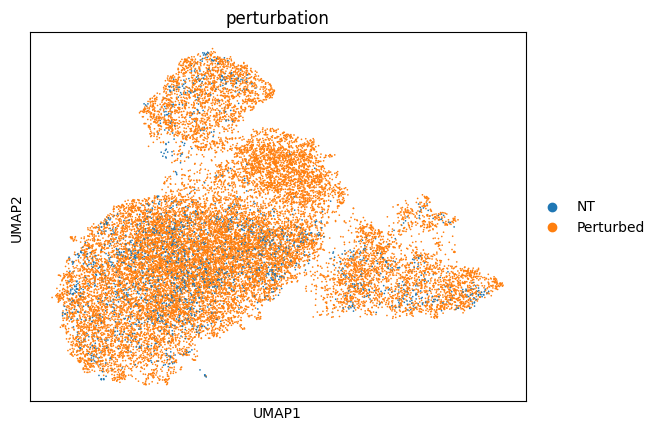

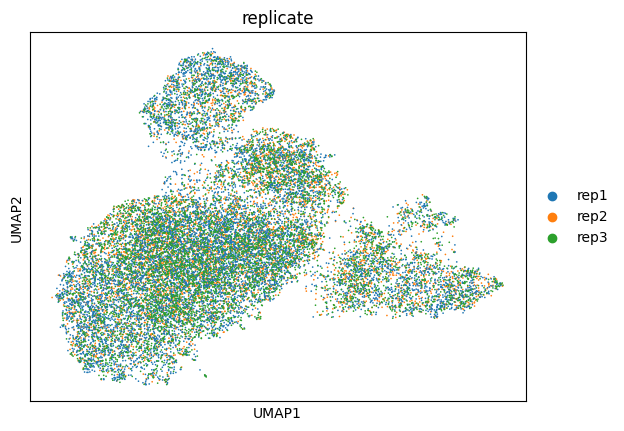

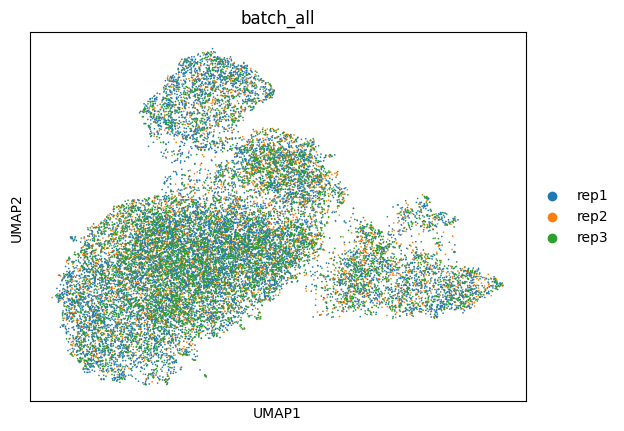

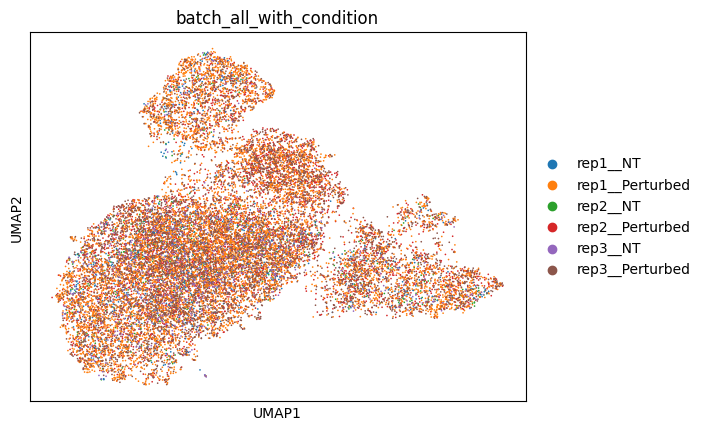

Plot of ITE


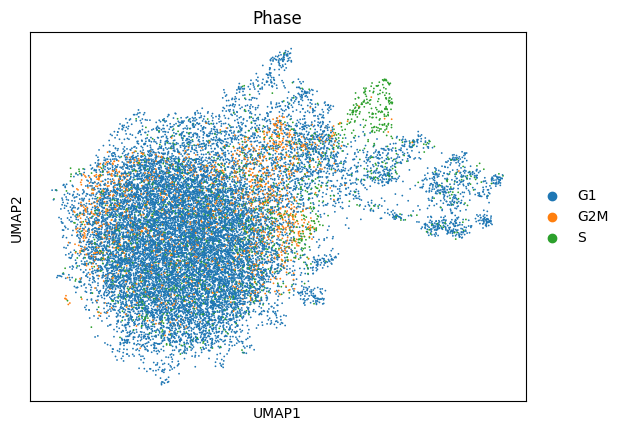

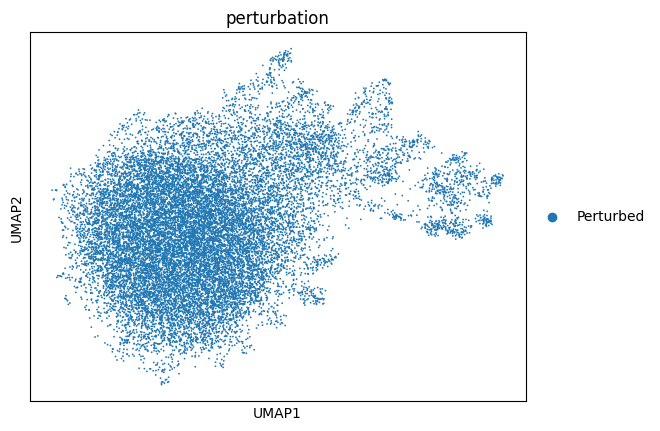

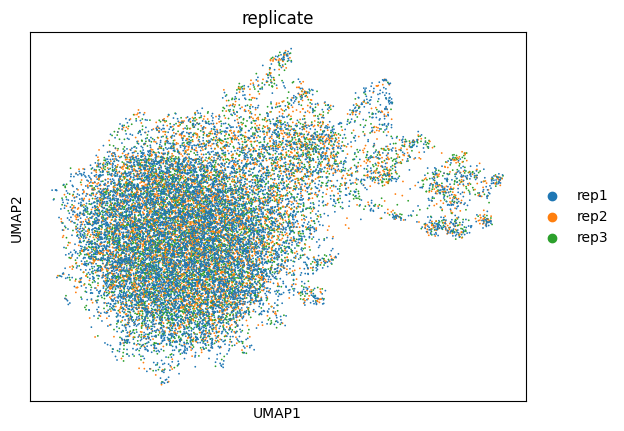

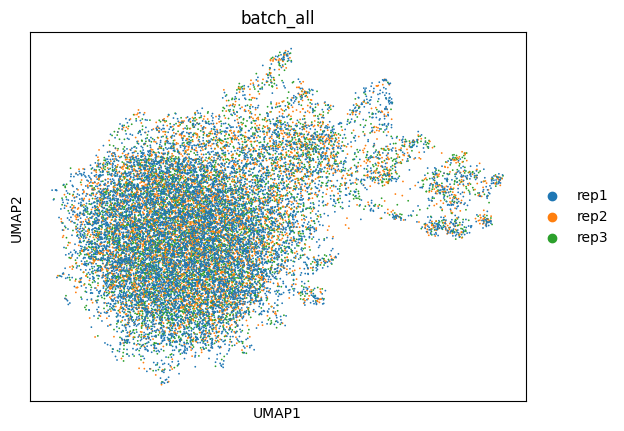

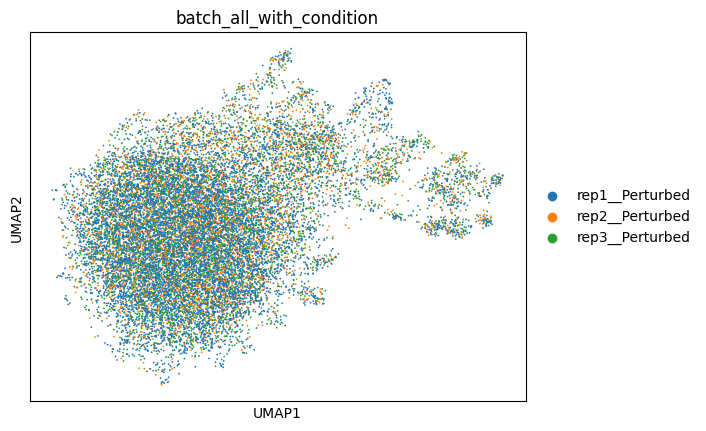

Within each unique condition, plot main effect
Now evaluating NT main effect


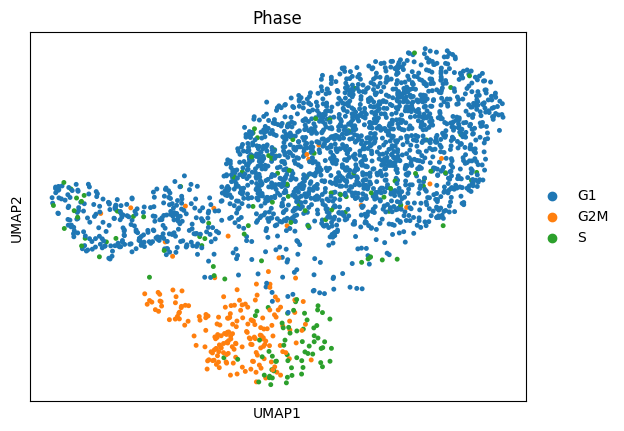

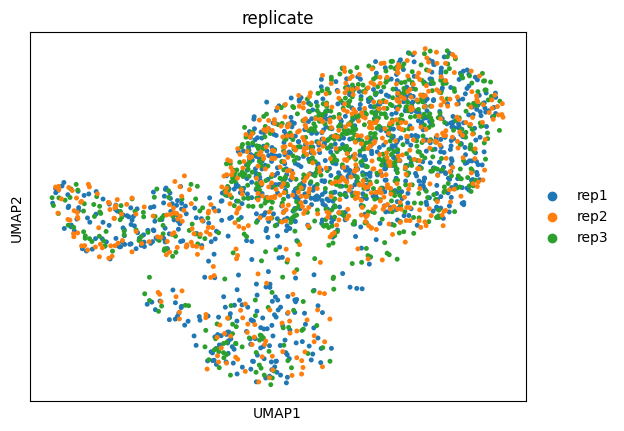

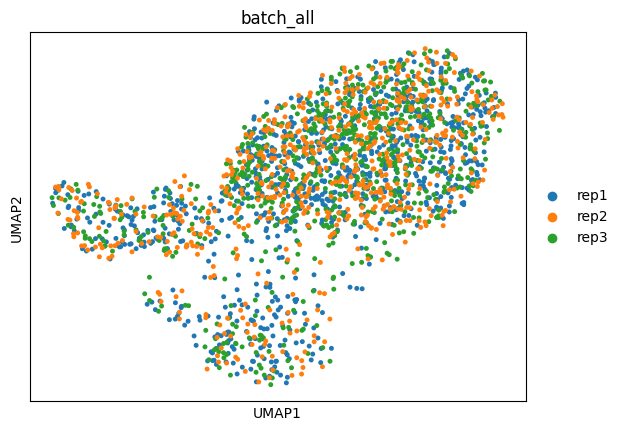

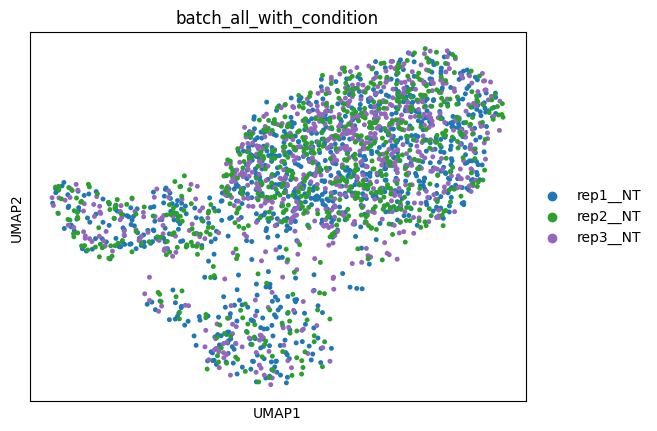

--------------------
Now evaluating Perturbed main effect


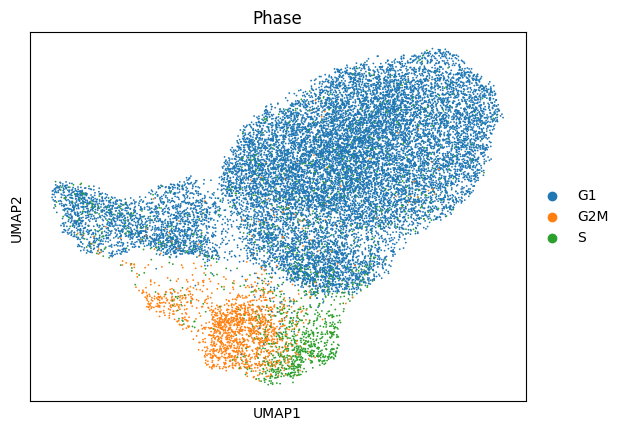

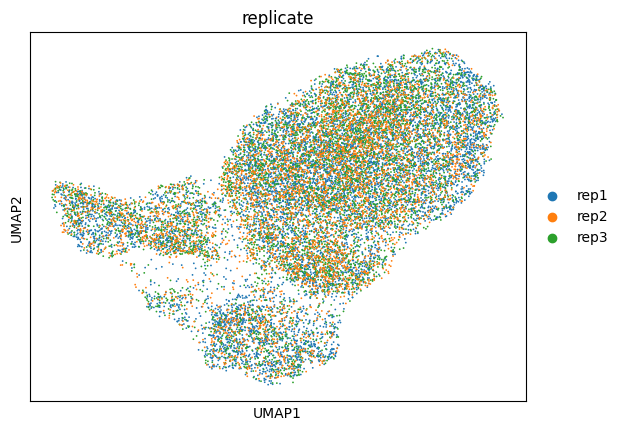

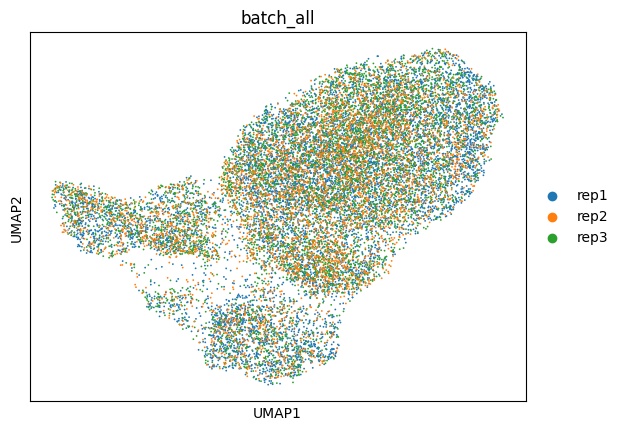

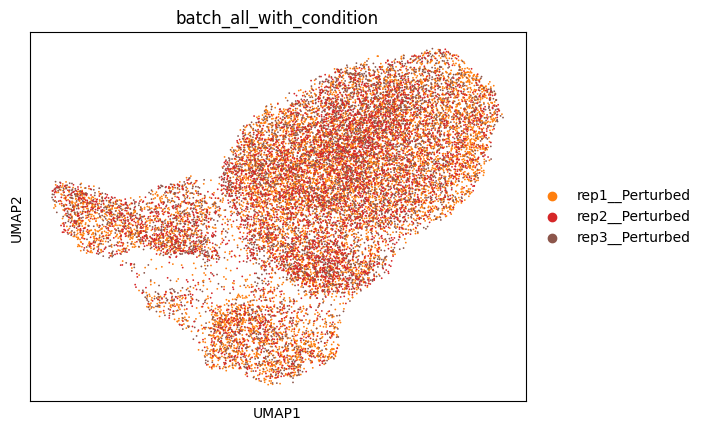

--------------------
Within each unique condition, plot denoised expression
Now evaluating NT denoised expression


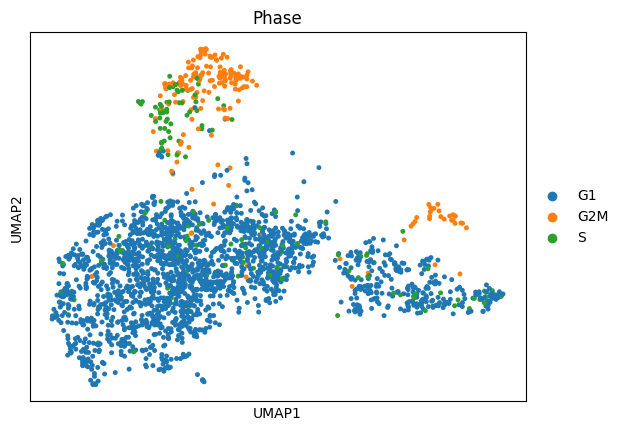

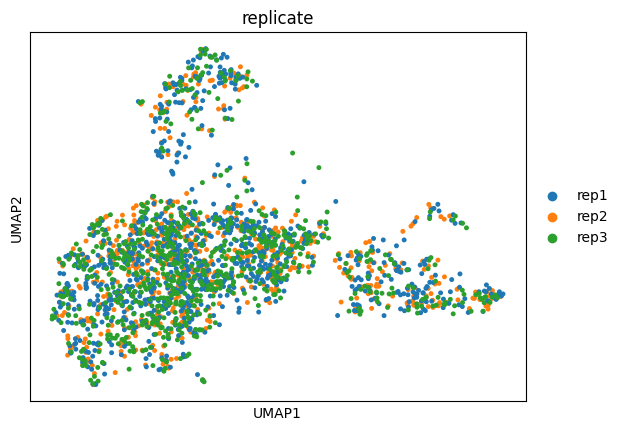

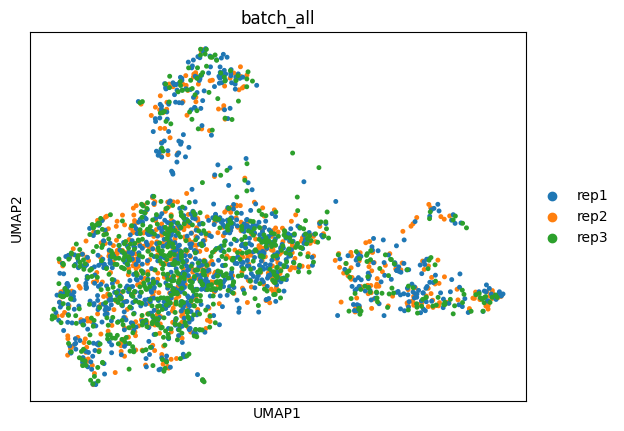

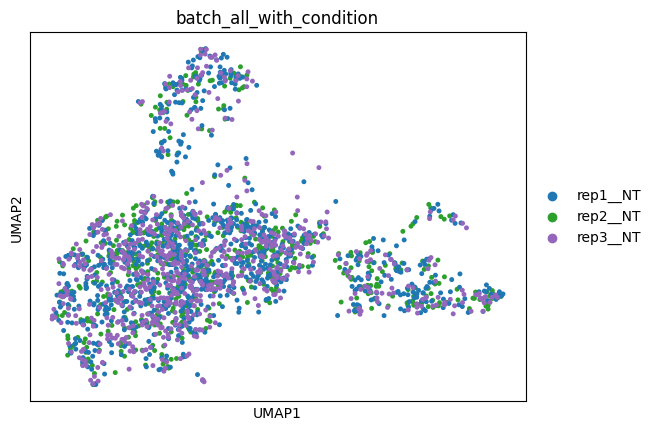

--------------------
Now evaluating Perturbed denoised expression


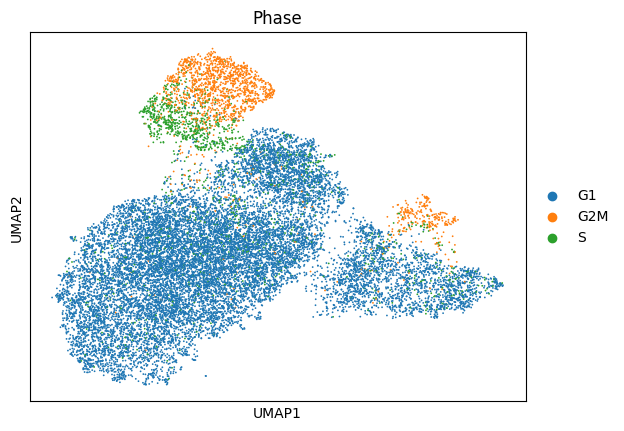

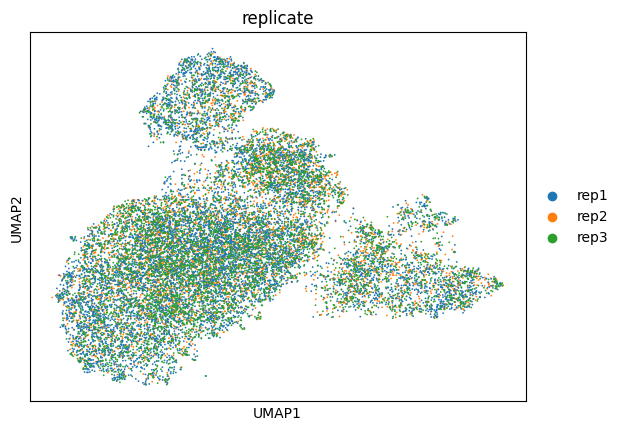

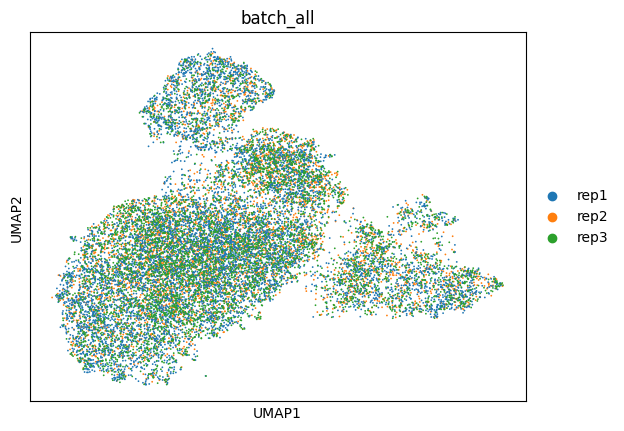

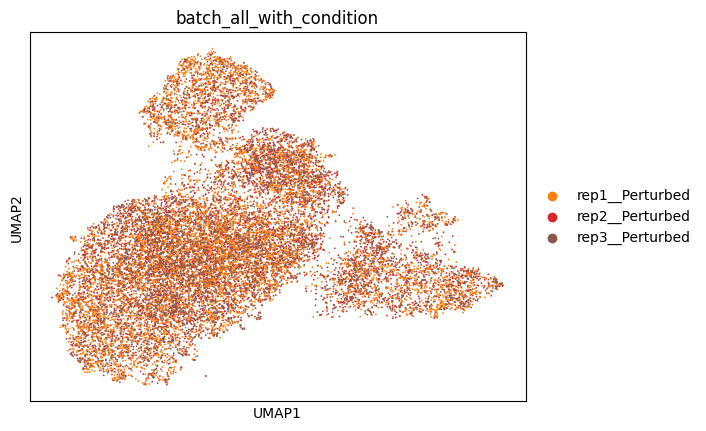

--------------------
Within each unique condition, plot ITE
Now evaluating NT ITE
Now evaluating Perturbed ITE


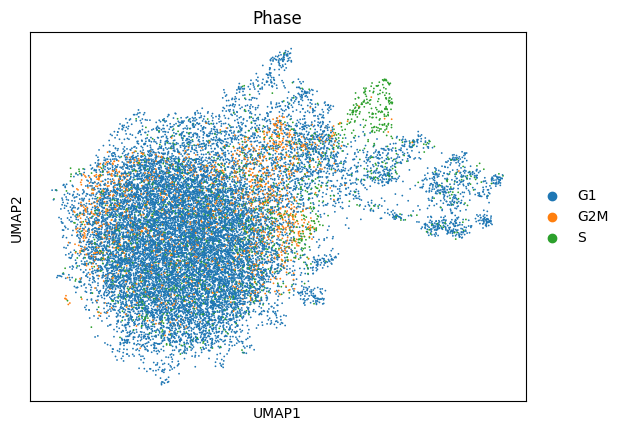

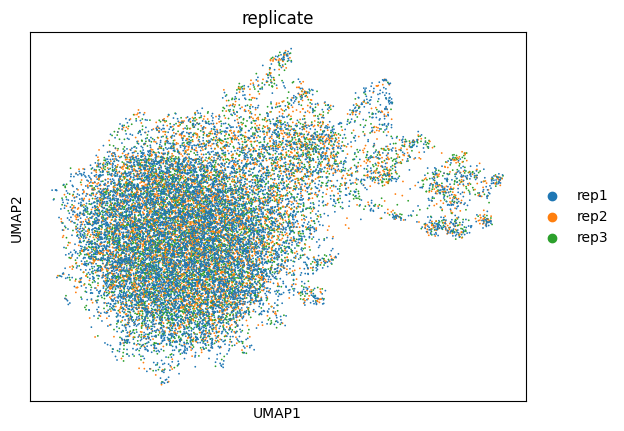

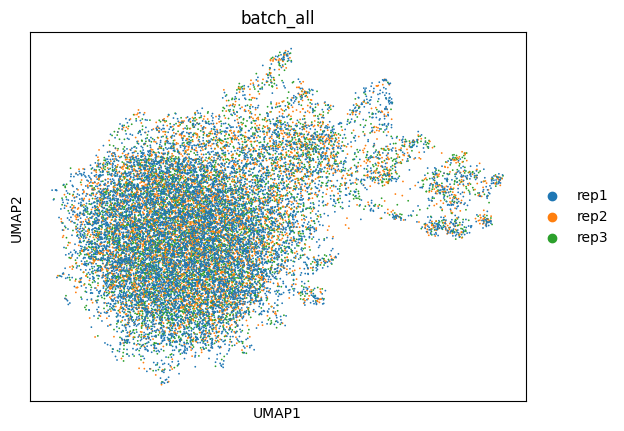

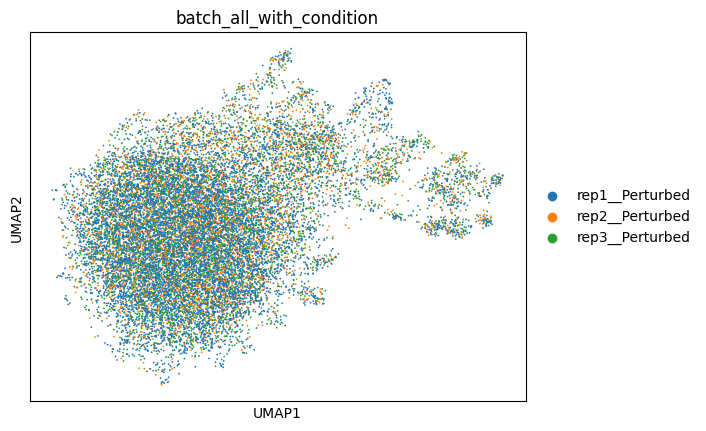

--------------------


In [3]:
plot_ndreamer(dataset_name="ECCITE_perturbation", cell_type_key="Phase", batch_key="replicate", condition_key="perturbation")